# Demo: Faster RCNN for Object Detection

## Faster RCNN model

The faster rcnn model requires training data in [COCO format](http://cocodataset.org/#home). COCO is a json style format with entries for "images", "annotations", and "categories". For this task we only use 1 category, as we consider all option bubbles the same object regardless of shape. The "images" entry gives the sizes and filenames of the training images, "annotations" gives the target object locations and sizes. We used a simple custom-built in-browser markup tool to record boundings of contest boxes and their option bubbles.

The code below takes in the output of our simple python/Flask markup tool and creates **cropped jpg images** of each contests and (2) **COCO datasets** for contests within ballot pages and for options within contest images. The current implementation assumes a directory of subdirectories for each ballot; the subdirectories contain a jpg for each page of the ballot. This was done out of convenience since our markup tool creates the jpgs as ballots are loaded.

*(this code is replicated in make_coco.py)*

### code


In [12]:
import os, sys
from PIL import Image, ImageDraw
import json

training="my_data/training.txt"
directory="my_data/ballots"
dest1="my_data/pages"
dest2="my_data/contests"
coco1="contests_coco.json"
coco2="options_coco.json"

img_files = {}
subs=[]
for f in os.listdir(directory):
	if os.path.isdir(directory+"/"+f):
		subs.append(f)
subs.sort()
print("subs ",subs)
for f in subs:
	print("directory: ",f)
	tmplist=[]
	for g in os.listdir(directory+"/"+f) :
		if "jpg" in g:
			tmplist.append(g)
	tmplist.sort()
	img_files[f]=tmplist
print("image files in directories",img_files)
# img_files.sort() # images of ballot pages

print("reading from",training)

rawtext= open(training,"r")
lines = rawtext.readlines()
print("number of lines",len(lines))

contests=[]
options=[]
for line in lines:
	temp_dict={}
	temp_str = line.split(",")
	temp_str[len(temp_str)-1] = temp_str[len(temp_str)-1].strip()
	if temp_str[0]=="C":
		temp_dict['id']=int(temp_str[1])
		temp_dict['x1']=float(temp_str[3])
		temp_dict['y1']=float(temp_str[4])
		temp_dict['x2']=float(temp_str[5])
		temp_dict['y2']=float(temp_str[6])
		temp_dict['page']=int(temp_str[7])
		temp_dict['page-width']=int(temp_str[8])
		temp_dict['page-height']=int(temp_str[9])
		temp_dict['options']=[]
		temp_dict['ballot']=int(temp_str[10])
		contests.append(temp_dict)
	else :
		temp_dict['id']=int(temp_str[1])
		temp_dict['x1']=float(temp_str[3])
		temp_dict['y1']=float(temp_str[4])
		temp_dict['x2']=float(temp_str[5])
		temp_dict['y2']=float(temp_str[6])
		temp_dict['contest_id']=int(temp_str[7])
		options.append(temp_dict)

for op in options:

	for con in contests:
		if op['contest_id']==con['id']:
			con['options'].append(op)
			break

# make contest images
# img_files[x] is the file for any contest with contest[page]==x+1
# print(contests)

coco_c={}
coco_c['images']=[]
coco_c['annotations']=[]
coco_c['categories']=[]
coco_o={}
coco_o['images']=[]
coco_o['annotations']=[]
coco_o['categories']=[]

imgs=[]
page_names={}
for sub in subs:
	tmp=[]
	print(f"images in subdir {sub}: {img_files[sub]}")
	for imgf in img_files[sub]:
		img = Image.open(directory+"/"+sub+"/"+imgf)
		tmp.append((img,imgf))
	imgs.append(tmp)
contest_imgs={}
# print(f"there are {sum(len(x) for x in imgs)} images")
# i = input("pause")

idx=0
img_names={}
for contest in contests:
	# print(f"contest{contest['id']}({contest['page']}) --> {img_files[contest['page']-1]}")
	shape  = (int(contest['page-width']*contest['x1']),int(contest['page-height']*contest['y1']),int(contest['page-width']*contest['x2']),int(contest['page-height']*contest['y2']))
	contest_x1,contest_y1,_,_ = shape
	print(f"shape of contest{contest['id']} {shape}")
	print(f"contest{contest['id']} page {contest['page']}")
	# save cropped image
	print(f"img = imgs[{contest['ballot']-1}][{contest['page']-1}].crop({shape})")
	img, img_name = imgs[contest['ballot']-1][contest['page']-1]
	contest_img = img.crop(shape)

	new_name=f"contest{idx}.jpg"
	contest_img.save(dest2+"/"+new_name)
	contest_imgs[contest['id']]=contest_img
	idx=idx+1

	# make COCO library for Images for the CONTESTS
	if img_name not in img_names.keys():
		num = len(img_names.keys())
		img.save(f"{dest1}/page{num}.jpg")
		w,h=img.size
		img_names[img_name] = len(img_names.keys())+1
		tmp_dict = {}
		tmp_dict['id']=len(img_names.keys())
		tmp_dict['width']=w
		tmp_dict['height']=h
		tmp_dict['file_name']=f"page{num}.jpg"
		tmp_dict['license']=""
		tmp_dict['date_captured']=""
		# print("IMAGE ", contest['id'],img_name)
		coco_c['images'].append(tmp_dict)

	# contest data COCO annotations
	tmp_dict={}
	w,h=img.size
	new_x1,new_y1,new_x2,new_y2 = (int(contest['page-width']*contest['x1']),int(contest['page-height']*contest['y1']),int(contest['page-width']*contest['x2']),int(contest['page-height']*contest['y2']))
	cw=new_x2-new_x1
	ch=new_y2-new_y1

	tmp_dict['id']=contest['id']
	tmp_dict['image_id']=img_names[img_name]
	tmp_dict['category_id']=1
	tmp_dict['segmentation']=[]
	tmp_dict['area']=cw*ch
	tmp_dict['bbox']=[new_x1,new_y1,cw,ch]
	tmp_dict['iscrowd']=0

	# print("options: ",tmp_dict)
	coco_c['annotations'].append(tmp_dict)

	

	# make COCO Images for the option data
	tmp_dict_contest = {}
	tmp_dict_contest['id']=contest['id']
	w,h=contest_img.size
	tmp_dict_contest['width']=w
	tmp_dict_contest['height']=h
	tmp_dict_contest['file_name']=new_name
	tmp_dict_contest['license']=""
	tmp_dict_contest['date_captured']=""

	coco_o['images'].append(tmp_dict_contest)

	# make COCO annotations for each option
	for option in contest['options']:
		tmp_dict_option={}
		new_x1,new_y1,new_x2,new_y2 = (int(contest['page-width']*option['x1']),int(contest['page-height']*option['y1']),int(contest['page-width']*option['x2']),int(contest['page-height']*option['y2']))
		
		if option['id'] == 57:
			print(f"{option['id']} {new_x1} {new_y1} {new_x2} {new_y2} , contest x and y: {contest_x1} {contest_y1}")

		op_w=new_x2-new_x1
		op_h=new_y2-new_y1


		new_x1=new_x1-contest_x1
		new_y1=new_y1-contest_y1
		new_x2=new_x2-contest_x1
		new_y2=new_y2-contest_y1
		if new_x1 < 0:
			print(f"{option['id']} {new_x1} {new_y1} {new_x2} {new_y2} , contest x and y: {contest_x1} {contest_y1}")
			j = input("asdfas")

		tmp_dict_option['id']=option['id']
		tmp_dict_option['image_id']=option['contest_id']
		tmp_dict_option['category_id']=1
		tmp_dict_option['segmentation']=[]
		tmp_dict_option['area']=op_w*op_h
		tmp_dict_option['bbox']=[new_x1,new_y1,op_w,op_h]
		tmp_dict_option['iscrowd']=0

		# print("options: ",tmp_dict_option)
		coco_o['annotations'].append(tmp_dict_option)

coco_o['categories'].append({
	"id":1,
	"name":"option",
	"supercategory":"none"
	})
coco_c['categories'].append({
	"id":1,
	"name":"contest",
	"supercategory":"none"
	})
# print(coco_c)

# make COCO categories
with open(coco2, "w+") as outfile: 
	json.dump(coco_o, outfile) 

with open(coco1, "w+") as outfile: 
	json.dump(coco_c, outfile) 



subs  ['b1', 'b2', 'b3']
directory:  b1
directory:  b2
directory:  b3
image files in directories {'b1': ['tmp0001-1.jpg', 'tmp0001-2.jpg'], 'b2': ['tmp0002-1.jpg', 'tmp0002-2.jpg'], 'b3': ['tmp0003-1.jpg', 'tmp0003-2.jpg', 'tmp0003-3.jpg', 'tmp0003-4.jpg']}
reading from my_data/training.txt
number of lines 97
images in subdir b1: ['tmp0001-1.jpg', 'tmp0001-2.jpg']
images in subdir b2: ['tmp0002-1.jpg', 'tmp0002-2.jpg']
images in subdir b3: ['tmp0003-1.jpg', 'tmp0003-2.jpg', 'tmp0003-3.jpg', 'tmp0003-4.jpg']
shape of contest1 (50, 938, 549, 1643)
contest1 page 1
img = imgs[0][0].crop((50, 938, 549, 1643))
shape of contest2 (52, 1648, 545, 2091)
contest2 page 1
img = imgs[0][0].crop((52, 1648, 545, 2091))
shape of contest3 (54, 2094, 545, 2386)
contest3 page 1
img = imgs[0][0].crop((54, 2094, 545, 2386))
shape of contest4 (50, 2470, 543, 2879)
contest4 page 1
img = imgs[0][0].crop((50, 2470, 543, 2879))
shape of contest5 (552, 726, 1094, 1182)
contest5 page 1
img = imgs[0][0].crop((552, 

In [8]:
# it mat be necessary to remove ipynb_checkpoints/ directory 
l = os.listdir("my_data/contests")
l.sort()
print(l)

['.ipynb_checkpoints', 'contest0.jpg', 'contest1.jpg', 'contest10.jpg', 'contest11.jpg', 'contest12.jpg', 'contest13.jpg', 'contest14.jpg', 'contest15.jpg', 'contest2.jpg', 'contest3.jpg', 'contest35.jpg', 'contest36.jpg', 'contest37.jpg', 'contest38.jpg', 'contest39.jpg', 'contest4.jpg', 'contest41.jpg', 'contest42.jpg', 'contest43.jpg', 'contest44.jpg', 'contest45.jpg', 'contest46.jpg', 'contest47.jpg', 'contest48.jpg', 'contest49.jpg', 'contest5.jpg', 'contest6.jpg', 'contest7.jpg', 'contest8.jpg', 'contest9.jpg']


## Option Detection

### training
The model is quick to train for training object detection on the option bubbles in different types of ballots. Only 3 contest boxes from the third ballot were included, along with 15 from the first 2 ballots; all of the remaining options in the third ballot were detected, as their is no variation in the shape of these bubbles on a given ballot. We never found the need to train for more than 25 epochs when detecting option bubbles, which takes just a few minutes with Google Colab's GPU. This model benefits from the use of a pytorch ResNet50 backbone, meaning only the last layer of the model requires training.

### configuration

In [13]:
import torch
import time
from utils import (
    get_model_instance_segmentation,
    collate_fn,
    get_transform,
    myOwnDataset,
)

train_data_dir="my_data/contests"
train_coco="options_coco.json"
eval_dir="my_data/eval"
train_batch_size=2
train_shuffle_dl=True
num_workers_dl=4
num_classes=2
lr=.005
momentum=.9
weight_decay=.005
num_epochs=25
save="option_model"

print("Torch version:", torch.__version__)

# create own Dataset
my_dataset = myOwnDataset(
    root=train_data_dir, annotation=train_coco, transforms=get_transform()
)

# own DataLoader
data_loader = torch.utils.data.DataLoader(
    my_dataset,
    batch_size=train_batch_size,
    shuffle=train_shuffle_dl,
    num_workers=num_workers_dl,
    collate_fn=collate_fn,
)

print(data_loader)

# select device (whether GPU or CPU)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

print("device: ",device)

# DataLoader is iterable over Dataset
for imgs, annotations in data_loader:
    imgs = list(img.to(device) for img in imgs)
    temp = [{k: v.to(device) for k, v in t.items()} for t in annotations]
    # print(imgs)
    print(temp)

# variable = input("press soemthign")


contest_detector = get_model_instance_segmentation(num_classes)

# move model to the right device
contest_detector.to(device)

# parameters
params = [p for p in contest_detector.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params, lr=lr, momentum=momentum, weight_decay=weight_decay
)

len_dataloader = len(data_loader)

for epoch in range(num_epochs):
    print(f"Epoch: {epoch+1}/{num_epochs}")
    start = time.time()
    contest_detector.train()
    i = 0
    for imgs, annotations in data_loader:
        i += 1
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = contest_detector(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        print(f"Iteration: {i}/{len_dataloader}, Loss: {losses}, Time: {time.time()-start}s")

# torch.save(contest_detector,save)

Torch version: 1.5.0+cu101
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
device:  cuda
[{'boxes': tensor([[ 54., 196.,  92., 225.],
        [ 56., 296.,  92., 324.],
        [ 54., 395.,  92., 423.],
        [ 54., 495.,  92., 526.],
        [ 54., 596.,  94., 626.]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1], device='cuda:0'), 'image_id': tensor([1], device='cuda:0'), 'area': tensor([1102., 1008., 1064., 1178., 1200.], device='cuda:0'), 'iscrowd': tensor([0, 0, 0, 0, 0], device='cuda:0')}, {'boxes': tensor([[ 51., 112.,  94., 138.],
        [ 54., 162.,  94., 189.],
        [ 56., 211.,  94., 237.],
        [ 53., 262.,  94., 286.],
        [ 54., 309.,  94., 337.],
        [ 53., 359.,  94., 388.]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1], device='cuda:0'), 'image_id': tensor([9], device='cuda:0'), 'area': tensor([1118., 1080.,  988.,  984., 1120., 1189.], device='cuda:0'), 'iscrowd': tensor([0, 0, 0, 0, 0, 0], device='cuda:

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Iteration: 1/9, Loss: 1.4294461011886597, Time: 0.7147061824798584s
Iteration: 2/9, Loss: 1.3905348777770996, Time: 1.2215135097503662s
Iteration: 3/9, Loss: 1.3844523429870605, Time: 1.5740797519683838s
Iteration: 4/9, Loss: 1.332445740699768, Time: 1.937222957611084s
Iteration: 5/9, Loss: 1.3018426895141602, Time: 2.2465789318084717s
Iteration: 6/9, Loss: 1.2374076843261719, Time: 2.628514289855957s
Iteration: 7/9, Loss: 1.148674488067627, Time: 2.994462728500366s
Iteration: 8/9, Loss: 1.1875256299972534, Time: 3.279698133468628s
Iteration: 9/9, Loss: 0.9754481315612793, Time: 3.645486354827881s
Epoch: 2/25
Iteration: 1/9, Loss: 0.8675805926322937, Time: 0.5018281936645508s
Iteration: 2/9, Loss: 0.7124832272529602, Time: 0.9011144638061523s
Iteration: 3/9, Loss: 0.7373788952827454, Time: 1.2622880935668945s
Iteration: 4/9, Loss: 0.9598167538642883, Time: 1.574774980545044s
Iteration: 5/9, Loss: 1.1149364709854126, Time: 1.9409823417663574s
Iteration: 6/9, Loss: 0.6932423710823059, Ti

### evaluation

Generating a set of contests for evaluation can be done with the same code as make_coco.py; this script generates COCO datasets as well as cropped images for each contests. I redirected the output to an evaluation folder and discarded the coco datasets (I did not markup the options within the contests).

contest37.jpg
[{'boxes': tensor([[  4.1300, 108.5847,  18.5096, 117.6191],
        [  4.0819,  75.9600,  18.4719,  84.9006],
        [  4.1197, 141.4131,  18.2843, 150.2180],
        [  9.2830, 141.5208,  14.8239, 149.8425],
        [  9.0011,  76.4476,  14.9230,  85.5595],
        [  4.9946, 112.1773,  17.1448, 117.9765],
        [  4.9523, 145.0371,  16.8536, 150.6563],
        [  9.9722, 108.9467,  14.9817, 115.7029],
        [  5.9999,  79.2628,  16.5803,  85.4309],
        [  4.3368, 142.2763,  15.0777, 147.7279]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9936, 0.9934, 0.9927, 0.3317, 0.2984, 0.2756, 0.2602, 0.2116, 0.0708,
        0.0613], device='cuda:0', grad_fn=<IndexBackward>)}]


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


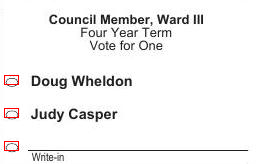

contest7.jpg
[{'boxes': tensor([[ 54.6859, 125.7950,  91.1353, 151.6974],
        [ 55.8157, 226.1126,  90.8660, 252.6318],
        [ 57.2227, 326.1341,  90.6198, 352.9237],
        [ 56.1847, 377.5136,  91.1946, 399.9542],
        [ 56.1071, 276.2312,  90.7654, 302.6573],
        [ 54.0501, 177.3353,  93.9551, 200.8962]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9914, 0.9889, 0.9885, 0.9877, 0.9868, 0.9867], device='cuda:0',
       grad_fn=<IndexBackward>)}]


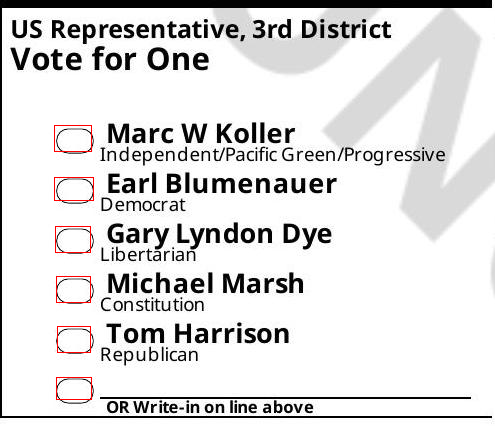

contest41.jpg
[{'boxes': tensor([[  9.0711,  75.7404,  20.9298,  84.7086],
        [  8.8944, 108.8382,  21.1652, 116.8616],
        [142.6086,  40.1469, 150.1538,  45.8480],
        [ 14.1830, 108.7413,  19.1883, 117.1164],
        [  9.8798, 108.2341,  20.2312, 113.7468],
        [ 14.0632,  75.9662,  19.3232,  83.6029],
        [ 10.9797,  75.9112,  20.4991,  81.1218]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9948, 0.9932, 0.6227, 0.1176, 0.0700, 0.0693, 0.0649],
       device='cuda:0', grad_fn=<IndexBackward>)}]


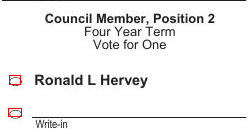

contest12.jpg
[{'boxes': tensor([[ 54.3769, 141.8497,  89.8356, 167.4172],
        [ 54.3800, 191.0619,  89.9638, 216.0444]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1], device='cuda:0'), 'scores': tensor([0.9947, 0.9923], device='cuda:0', grad_fn=<IndexBackward>)}]


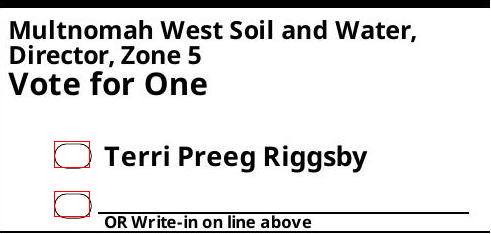

contest3.jpg
[{'boxes': tensor([[ 56.0812, 116.1101,  91.9069, 138.8883],
        [ 55.5993, 165.9028,  93.0726, 189.8497],
        [ 55.7462, 215.8368,  92.6822, 239.5834],
        [ 55.9848, 364.5389,  91.9666, 389.9210],
        [ 55.5784, 265.6467,  93.0253, 289.4278],
        [ 56.3556, 314.0298,  92.6687, 341.2823]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9940, 0.9919, 0.9918, 0.9910, 0.9907, 0.9899], device='cuda:0',
       grad_fn=<IndexBackward>)}]


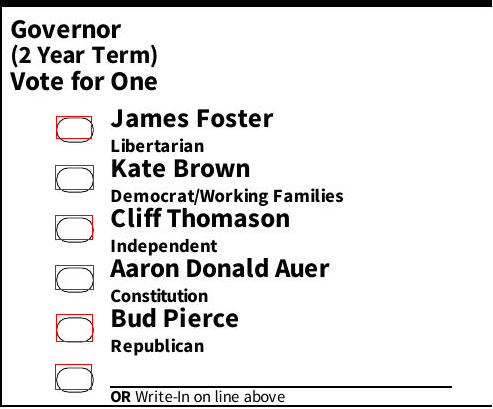

contest46.jpg
[{'boxes': tensor([[  5.7093, 172.8658,  20.5809, 184.5579],
        [  6.2141, 204.8187,  20.4873, 216.4776],
        [  5.9139, 107.6124,  20.3652, 117.5339],
        [  5.8033,  76.3076,  20.3506,  84.4997],
        [  6.2651, 239.6039,  21.1758, 248.0806],
        [  6.3899, 139.7684,  20.3081, 150.2664],
        [  6.4231,  71.7628,  17.7548,  85.8554],
        [  5.8012, 236.7201,  20.8713, 245.0120],
        [  2.7474, 237.1057,  22.1798, 250.7766],
        [  6.5172,  72.9124,  20.6908,  80.7188],
        [  7.5926, 236.4308,  16.1885, 249.5005],
        [  7.4131, 172.2265,  14.7259, 182.3823],
        [  7.5819, 107.4250,  15.4079, 116.7085],
        [  8.0085, 139.6127,  15.3595, 148.2029],
        [  7.0554, 206.5218,  14.1821, 215.8223],
        [ 10.3826, 236.3495,  20.0625, 250.3883],
        [ 13.3617, 108.3488,  20.0043, 116.2837],
        [ 10.1573,  73.6824,  19.8781,  86.2544],
        [ 13.3974, 140.1513,  20.1444, 148.3352]], device='cuda:0',
       

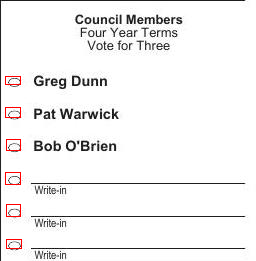

contest2.jpg
[{'boxes': tensor([[ 53.1963, 141.9364,  86.5928, 167.3144],
        [ 53.2846, 241.7647,  86.5523, 265.9674],
        [ 53.4495,  92.5956,  86.4082, 117.4080],
        [ 52.8297, 190.8956,  86.8622, 216.0714]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9957, 0.9948, 0.9945, 0.9944], device='cuda:0',
       grad_fn=<IndexBackward>)}]


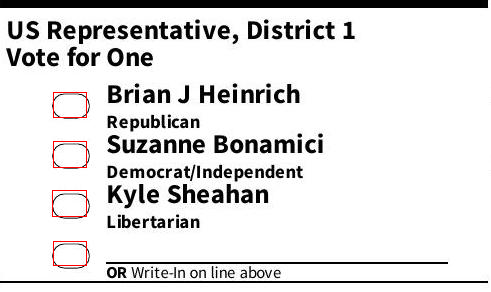

contest36.jpg
[{'boxes': tensor([[  4.4375, 107.5261,  18.4996, 116.4835],
        [  4.3688, 140.1406,  18.2738, 148.9663],
        [  4.4410,  74.7771,  18.5323,  83.7407],
        [  9.8804,  75.6091,  14.9478,  82.2312],
        [  9.8369, 108.3721,  14.9947, 115.0379],
        [  9.8876, 141.1269,  14.8608, 147.5389],
        [  7.4855, 106.3787,  17.1507, 114.2331]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9934, 0.9928, 0.9928, 0.2156, 0.1746, 0.1552, 0.0520],
       device='cuda:0', grad_fn=<IndexBackward>)}]


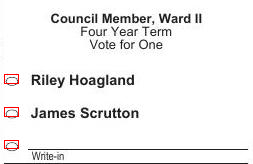

contest10.jpg
[{'boxes': tensor([[ 54.3793, 121.4809,  91.1226, 146.2462],
        [ 54.6216, 171.2898,  90.4156, 196.5554],
        [ 60.9807, 175.3712,  88.8636, 189.4610]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1], device='cuda:0'), 'scores': tensor([0.9928, 0.9905, 0.0794], device='cuda:0', grad_fn=<IndexBackward>)}]


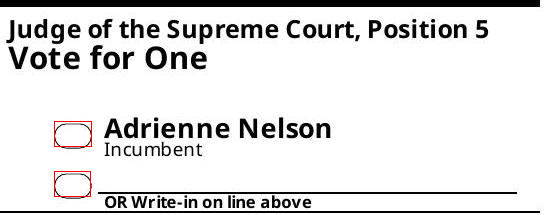

contest42.jpg
[{'boxes': tensor([[ 10.5975,  73.7712,  23.5344,  82.1408],
        [ 10.6411, 105.9492,  23.4759, 114.2553],
        [ 15.1409,  73.8869,  20.3636,  82.2101],
        [ 15.4643, 107.2014,  19.9336, 112.8825],
        [ 47.0575,  11.5634,  54.6900,  17.2007]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9955, 0.9925, 0.2356, 0.1221, 0.0803], device='cuda:0',
       grad_fn=<IndexBackward>)}]


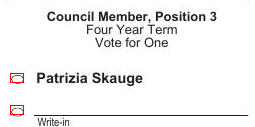

contest15.jpg
[{'boxes': tensor([[  3.9163, 108.3308,  18.1955, 119.1830],
        [  4.5326, 173.1464,  17.9434, 184.1126],
        [  4.1188, 142.1646,  18.4748, 150.5022],
        [  3.8335,  76.4315,  18.3022,  86.3526],
        [  4.8485, 207.1698,  18.1683, 215.2793],
        [  5.9462,  76.2811,  12.2772,  85.3531],
        [  6.4269, 207.2541,  12.7624, 214.3487],
        [  6.2826, 142.0305,  12.2343, 149.4296],
        [  5.5095, 108.7941,  11.3752, 117.9145],
        [  6.3542, 172.6541,  12.4908, 181.2311],
        [  4.5622,  74.4954,  18.3455,  81.6090],
        [ 11.3166, 207.2424,  17.9943, 214.9634]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9925, 0.9881, 0.9871, 0.9866, 0.9756, 0.3839, 0.3615, 0.1737, 0.1545,
        0.1538, 0.0570, 0.0543], device='cuda:0', grad_fn=<IndexBackward>)}]


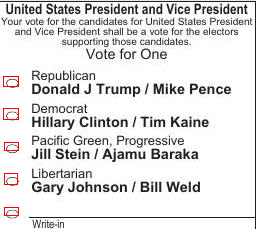

contest38.jpg
[{'boxes': tensor([[  4.7924, 106.9079,  18.3019, 115.5733],
        [  4.0543,  74.2591,  18.0272,  83.1030],
        [  6.5145, 107.6857,  16.6171, 113.2086],
        [  9.1929, 107.5799,  14.4762, 114.3802],
        [139.0458,  39.5601, 146.8101,  44.7320],
        [  9.4211,  74.6274,  14.2335,  82.7403],
        [  6.9346,  73.6394,  16.1265,  80.6995]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9902, 0.9899, 0.6756, 0.1952, 0.1457, 0.1156, 0.0518],
       device='cuda:0', grad_fn=<IndexBackward>)}]


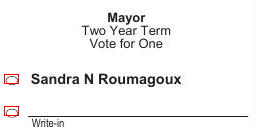

contest8.jpg
[{'boxes': tensor([[ 52.7638, 362.4794,  93.9170, 386.0807],
        [ 52.6313, 162.4246,  94.3040, 186.1796],
        [ 54.5266, 211.7818,  93.2290, 236.8218],
        [ 54.4846, 261.3556,  92.6662, 287.6061],
        [ 53.4360, 111.1407,  91.4240, 135.5312],
        [ 53.6352, 311.4910,  92.6337, 335.6430],
        [ 56.2680, 411.1222,  91.8150, 435.9866],
        [ 63.7544, 361.0815,  81.7160, 386.4241],
        [ 63.8170, 161.2767,  81.5864, 186.1255],
        [ 64.1357, 310.5656,  80.9364, 335.7332],
        [ 64.2869, 110.6183,  80.4704, 135.4731]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9932, 0.9921, 0.9894, 0.9861, 0.9860, 0.9856, 0.9847, 0.1267, 0.0867,
        0.0811, 0.0598], device='cuda:0', grad_fn=<IndexBackward>)}]


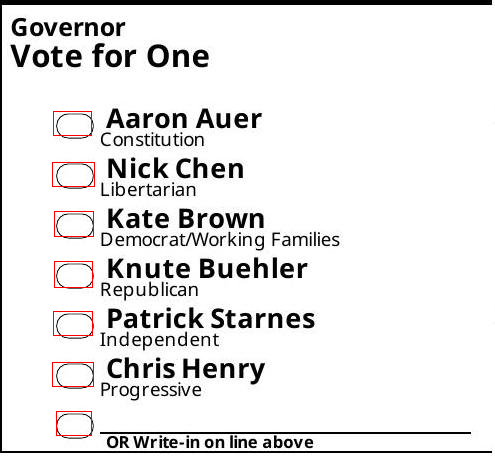

contest47.jpg
[{'boxes': tensor([[  6.7649, 107.9424,  19.7109, 117.4408],
        [  6.9335,  75.2083,  19.7830,  84.7190],
        [  6.9758, 140.8793,  19.5931, 150.0926],
        [ 10.1525, 141.5346,  15.6314, 148.0064],
        [ 10.0347, 108.5655,  15.7054, 115.4129],
        [ 10.0883,  75.8441,  15.7581,  82.6525]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9918, 0.9915, 0.9907, 0.3158, 0.2859, 0.2785], device='cuda:0',
       grad_fn=<IndexBackward>)}]


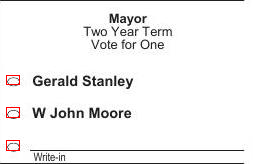

contest35.jpg
[{'boxes': tensor([[ 13.3212, 107.2147,  25.3757, 116.2347],
        [ 13.0706,  74.3497,  25.3115,  83.8282],
        [ 15.7880, 107.6099,  21.0667, 114.1459],
        [ 15.8187,  75.3865,  20.7168,  82.0954],
        [ 15.0858,  76.2851,  26.1902,  81.5311]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9936, 0.9891, 0.2169, 0.1220, 0.0614], device='cuda:0',
       grad_fn=<IndexBackward>)}]


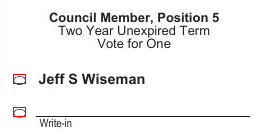

contest6.jpg
[{'boxes': tensor([[ 55.3473, 163.3130,  91.5391, 187.4550],
        [ 54.0479, 113.6333,  91.3031, 135.7381],
        [ 55.4457, 213.2361,  91.8105, 238.6502],
        [ 61.6771, 216.9986,  89.8846, 231.1519]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9931, 0.9930, 0.9925, 0.0623], device='cuda:0',
       grad_fn=<IndexBackward>)}]


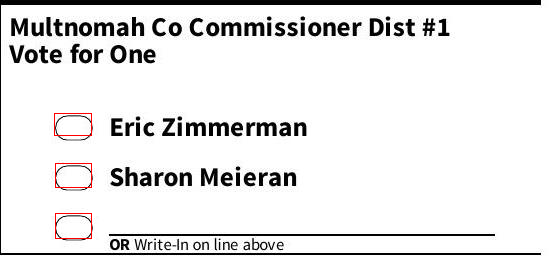

contest45.jpg
[{'boxes': tensor([[  7.3247, 107.2739,  19.3388, 116.1520],
        [  6.6605,  74.2071,  19.1424,  83.7661],
        [  9.6805, 107.6963,  14.9605, 114.0438],
        [  9.5573,  75.2306,  14.6605,  82.1912],
        [  5.9468,  76.3415,  17.5507,  81.5064]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9930, 0.9883, 0.1693, 0.1263, 0.1078], device='cuda:0',
       grad_fn=<IndexBackward>)}]


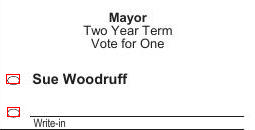

contest49.jpg
[{'boxes': tensor([[  9.3713, 106.2175,  20.9312, 115.0759],
        [ 11.2380, 107.2166,  21.9075, 112.5355]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1], device='cuda:0'), 'scores': tensor([0.9891, 0.1526], device='cuda:0', grad_fn=<IndexBackward>)}]


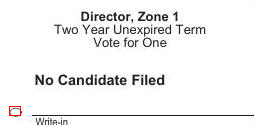

contest44.jpg
[{'boxes': tensor([[  7.4773, 206.1369,  23.1317, 214.5855],
        [  7.6219,  74.2444,  22.8936,  82.5958],
        [  7.7143, 237.7736,  23.4590, 246.2743],
        [  8.1315, 270.3420,  23.2776, 278.6521],
        [  8.2328, 106.3944,  23.3897, 114.5749],
        [  8.0484, 172.8916,  22.8927, 181.4013],
        [  7.7649, 301.7557,  23.7955, 313.3556],
        [  7.7242, 137.8004,  23.7529, 149.4500],
        [  6.1177, 268.4092,  26.3085, 281.0741],
        [ 14.4974, 235.5244,  21.7052, 247.2163],
        [  7.5727,  71.1729,  22.4474,  79.2284],
        [ 12.6608, 203.5868,  21.2323, 215.6978],
        [ 14.6090,  71.9701,  21.4977,  83.1991],
        [ 14.5883, 171.8947,  21.3548, 182.1817],
        [  8.9748, 170.8688,  17.5265, 182.5538],
        [  8.1159, 203.4934,  16.4845, 215.1784],
        [  7.6188, 234.9254,  22.8891, 242.4983],
        [  6.7125, 203.3201,  22.5669, 211.2181],
        [  8.1655,  71.2318,  16.4303,  83.4103],
        [ 13.9978, 302.49

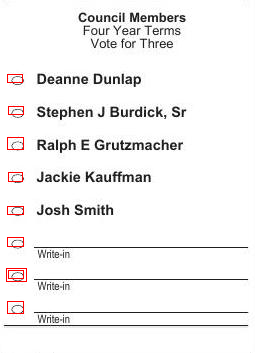

contest43.jpg
[{'boxes': tensor([[ 10.4594,  77.1066,  23.6368,  85.5659],
        [ 10.5625, 109.7721,  23.4107, 118.2676],
        [144.2542,  41.4997, 151.5121,  47.1897],
        [ 14.8681,  77.2839,  20.3989,  85.9559],
        [ 15.1014, 109.9102,  20.1808, 118.1312],
        [ 11.6766,  80.4228,  21.8627,  85.5863],
        [ 11.7946, 109.2568,  22.4905, 114.7056]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9961, 0.9958, 0.3625, 0.2754, 0.1969, 0.1870, 0.0794],
       device='cuda:0', grad_fn=<IndexBackward>)}]


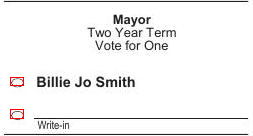

contest1.jpg
[{'boxes': tensor([[ 52.4528, 187.3183,  91.2932, 212.4717],
        [ 50.8104, 388.2216,  91.9398, 411.5640],
        [ 50.6321,  88.3816,  91.3818, 111.5259],
        [ 52.4498, 236.9807,  91.1693, 263.2100],
        [ 51.7506, 138.5654,  90.3560, 161.4945],
        [ 51.7080, 337.6763,  90.0488, 361.4307],
        [ 52.2414, 287.0635,  90.6719, 313.7260],
        [ 61.6362, 137.4497,  79.6926, 162.4502],
        [ 61.5356,  87.4108,  79.2896, 111.6461],
        [ 61.8918, 336.7744,  78.9939, 361.4102],
        [ 61.8065, 387.0962,  79.4328, 411.7162]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9937, 0.9929, 0.9921, 0.9914, 0.9896, 0.9890, 0.9867, 0.1432, 0.0841,
        0.0740, 0.0642], device='cuda:0', grad_fn=<IndexBackward>)}]


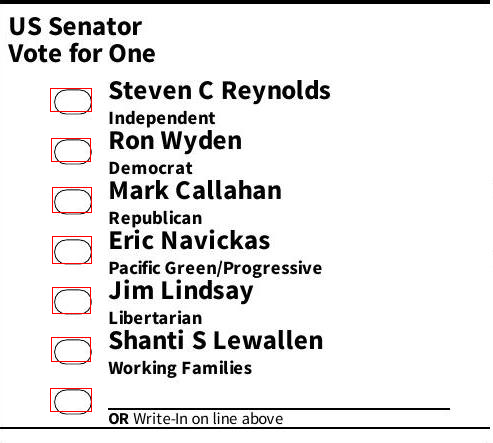

contest0.jpg
[{'boxes': tensor([[ 53.4207, 597.2862,  92.3652, 623.1473],
        [ 53.5040, 297.5290,  91.6126, 322.9754],
        [ 53.5775, 197.6406,  91.3357, 222.9166],
        [ 53.3563, 497.5196,  91.6791, 523.0718],
        [ 53.4178, 397.5129,  91.2585, 422.8095],
        [ 67.3616, 297.6353,  84.4125, 324.3145],
        [ 67.3116, 497.5430,  84.4334, 524.4113],
        [ 67.3471, 397.5519,  84.3038, 424.0686],
        [ 67.3013, 197.6691,  84.3728, 224.1539],
        [ 67.1898, 597.3608,  84.8340, 624.3978]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9975, 0.9974, 0.9974, 0.9972, 0.9971, 0.3189, 0.3173, 0.3143, 0.3043,
        0.2409], device='cuda:0', grad_fn=<IndexBackward>)}]


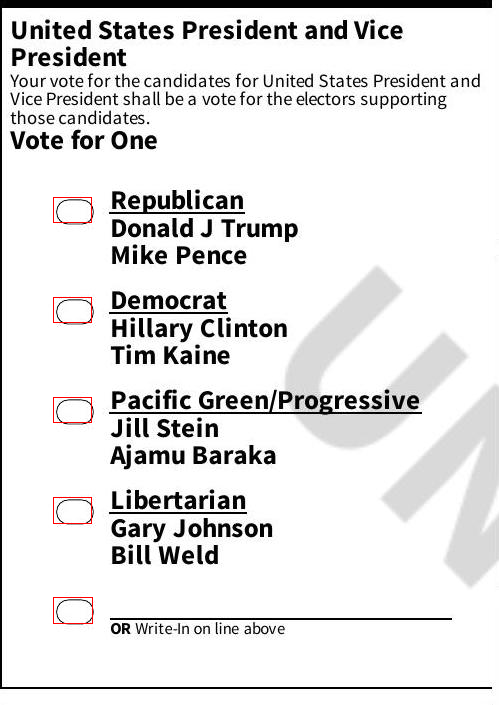

contest11.jpg
[{'boxes': tensor([[ 54.4972, 189.9438,  89.6586, 215.1632],
        [ 53.4248, 140.7284,  90.4688, 163.6921]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1], device='cuda:0'), 'scores': tensor([0.9940, 0.9926], device='cuda:0', grad_fn=<IndexBackward>)}]


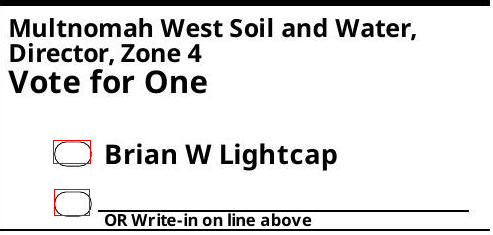

contest5.jpg
[{'boxes': tensor([[ 54.4537, 293.1065,  91.2677, 315.0441],
        [ 57.3308,  94.4226,  90.8564, 115.8485],
        [ 54.5502, 143.7684,  92.1882, 165.8473],
        [ 56.5184, 192.9257,  92.2880, 215.6626],
        [ 57.5949, 244.2821,  91.3774, 265.7051]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9944, 0.9936, 0.9932, 0.9926, 0.9917], device='cuda:0',
       grad_fn=<IndexBackward>)}]


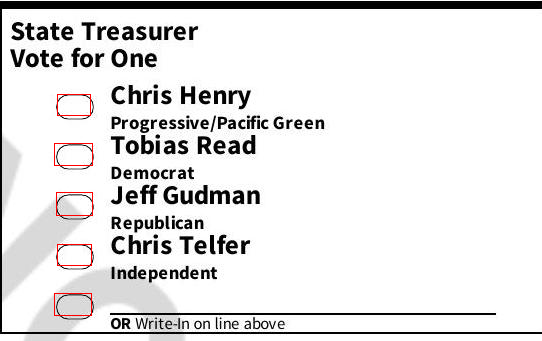

contest14.jpg
[{'boxes': tensor([[ 50.3850, 637.6636,  87.6227, 661.2300],
        [ 50.5293, 586.5323,  87.1826, 609.6537],
        [ 65.2423, 636.3311,  80.8828, 662.9913]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1], device='cuda:0'), 'scores': tensor([0.9935, 0.9907, 0.3273], device='cuda:0', grad_fn=<IndexBackward>)}]


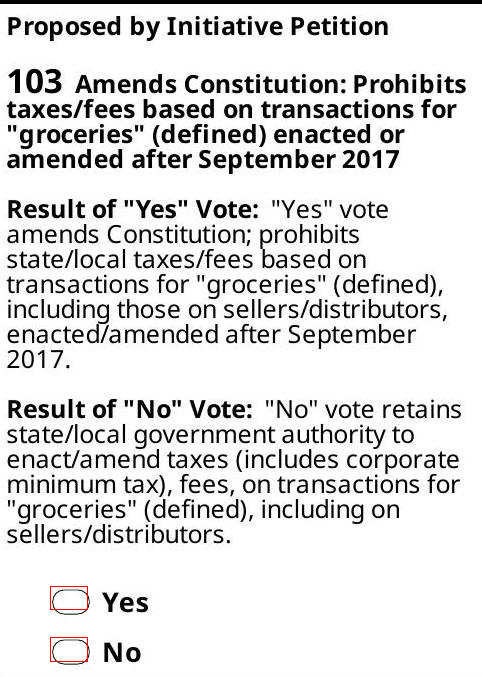

contest39.jpg
[{'boxes': tensor([[  5.4483,  72.5537,  20.4517,  82.3136],
        [  5.9352, 235.4832,  20.2745, 246.7992],
        [  5.5465, 169.5764,  20.9230, 180.6189],
        [  6.1982, 103.3671,  20.1139, 114.9956],
        [  5.6256, 138.7673,  20.2324, 146.9933],
        [  5.9745, 201.8704,  20.4706, 212.7454],
        [  7.0903,  70.5534,  15.2219,  82.8599],
        [  2.2345, 135.4938,  22.0463, 148.9058],
        [  7.3609, 234.6759,  14.6205, 244.4376],
        [  7.2442, 135.2713,  16.2924, 148.5679],
        [  7.6524, 202.0184,  15.5424, 211.0781],
        [  5.6819, 135.3946,  20.5288, 143.3138],
        [  7.2312, 169.8365,  15.6477, 179.6098],
        [ 13.1116, 202.5188,  20.2719, 211.1721],
        [  7.4281, 137.7780,  13.5794, 146.2619],
        [ 12.1983,  71.0258,  20.1103,  83.0689],
        [  7.2619, 105.6236,  15.0802, 114.5650],
        [ 10.4222, 135.1681,  19.8697, 149.1401]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 

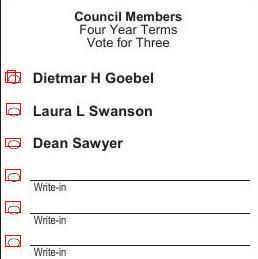

contest9.jpg
[{'boxes': tensor([[ 55.0455,  89.0590,  89.1357, 113.4082],
        [ 54.5687, 238.7007,  89.7233, 264.3489],
        [ 53.7858, 139.9289,  91.8476, 162.8778],
        [ 54.8060, 189.3202,  89.7078, 214.6274]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9953, 0.9933, 0.9933, 0.9929], device='cuda:0',
       grad_fn=<IndexBackward>)}]


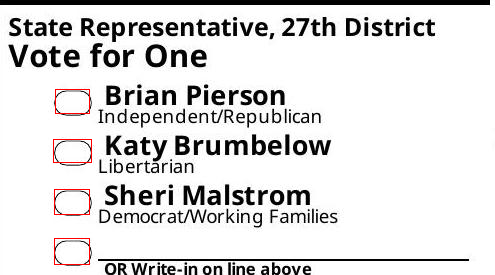

contest4.jpg
[{'boxes': tensor([[ 50.7654, 108.7926,  89.0796, 133.6048],
        [ 51.7373, 160.4679,  89.6861, 184.1008],
        [ 51.0254, 309.6565,  90.0839, 333.7689],
        [ 52.0490, 360.3640,  90.3327, 384.1209],
        [ 51.1814, 209.2417,  92.1795, 234.1335],
        [ 52.0538, 409.0178,  90.6023, 434.0105],
        [ 52.3413, 258.9395,  89.6586, 283.3730],
        [ 62.9228, 359.3576,  81.0253, 384.8694],
        [ 62.9289, 159.2815,  80.8567, 184.7988],
        [ 63.2531, 109.0504,  80.1254, 133.9857],
        [ 63.2759, 308.1515,  80.5106, 334.6415],
        [ 52.7229, 161.7980,  91.1110, 235.3209]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9961, 0.9954, 0.9952, 0.9951, 0.9891, 0.9890, 0.9888, 0.2069, 0.2049,
        0.1687, 0.1604, 0.0674], device='cuda:0', grad_fn=<IndexBackward>)}]


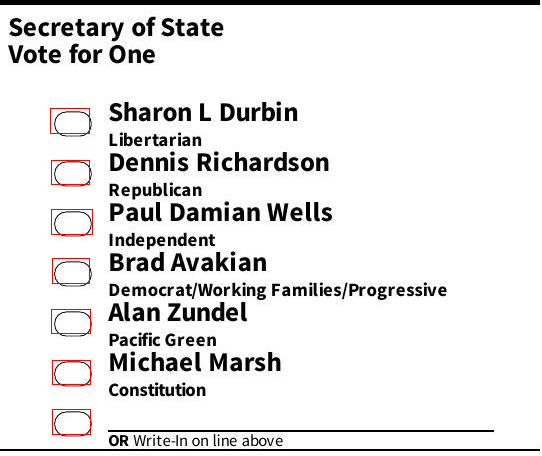

contest13.jpg
[{'boxes': tensor([[ 51.0301, 648.0399,  91.2409, 672.7068],
        [ 53.1305, 697.5745,  90.3142, 721.8144],
        [ 66.2774, 647.0869,  83.1809, 673.2746],
        [ 57.4296, 695.8348,  86.2988, 711.4156]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9937, 0.9843, 0.2737, 0.0503], device='cuda:0',
       grad_fn=<IndexBackward>)}]


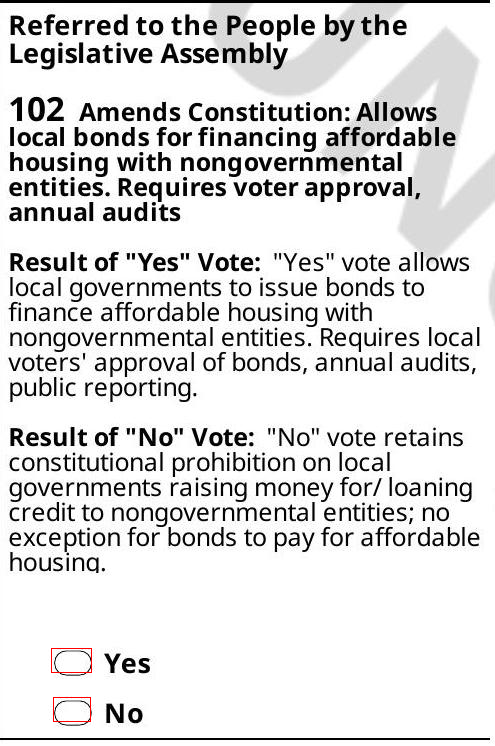

contest48.jpg
[{'boxes': tensor([[  4.6332,  71.8029,  19.3688,  81.2472],
        [  4.6813, 169.4382,  19.8325, 179.2251],
        [  5.5600, 136.3858,  18.9745, 146.9315],
        [  4.4515, 104.1880,  19.6704, 113.6354],
        [ 11.1602,  71.6472,  17.2829,  81.8381],
        [ 11.2011, 104.1317,  17.3261, 114.1351],
        [ 11.1847, 136.5583,  17.2906, 146.8381],
        [  6.3793, 168.6102,  18.8192, 175.4653],
        [ 11.2075, 168.8885,  17.2950, 179.6103],
        [  6.1728,  71.5151,  13.1409,  81.5289],
        [  6.2250, 103.8350,  13.0083, 113.8492],
        [  6.6810, 103.2393,  18.7914, 109.6954]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9902, 0.9900, 0.9850, 0.9808, 0.7334, 0.6276, 0.5818, 0.1884, 0.1731,
        0.0993, 0.0857, 0.0710], device='cuda:0', grad_fn=<IndexBackward>)}]


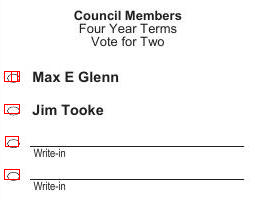

In [14]:
from PIL import ImageDraw
from PIL import Image
from IPython.display import display
import numpy as np
transforms=get_transform()
eval_dir = 'contests'
for imgpath in os.listdir(eval_dir):
  if 'jpg' in imgpath:  
    eval_img = Image.open(eval_dir+"/"+imgpath)
    trans_img = [transforms(eval_img).to(device)]
    contest_detector.eval()
    eval_results = contest_detector(trans_img)

    print(imgpath)
    print(eval_results)
    boxes=[]
    scores=[]
    for i in range(len(eval_results[0]['scores'])):
      if eval_results[0]['scores'][i] >= .7:
        boxes.append(eval_results[0]['boxes'][i].cpu().detach().tolist())

    for box in boxes:
      shape = [(box[0], box[1]), (box[2], box[3])] 
      img1 = ImageDraw.Draw(eval_img)   
      img1.rectangle(shape, outline ="red")

    display(eval_img)

In [0]:
# something

### conclusion

This pytorch model is, in our juedgement, more than capable of object detection for this task; the reason we need to detect bounding boxes of election options is that we need to place marks on those options for the purpose of generating fake data on which to train the Ballot Recognizer model. While we performed option detection here within individual contests, it is likely that we can perform the same task on larger images: full ballot pages. Fundamentally, our project architecture uses annotations of ballots by contest, but this FRCNN model could lend itself to different paradigms.

## Contest Detection

### data and training

In [19]:
import torch
import time
from utils import (
    get_model_instance_segmentation,
    collate_fn,
    get_transform,
    myOwnDataset,
)

train_data_dir="my_data/pages"
train_coco="contests_coco.json"
eval_dir="my_data/eval"
train_batch_size=2
train_shuffle_dl=True
num_workers_dl=4
num_classes=2
lr=.005
momentum=.9
weight_decay=.005
num_epochs=60
save="contest_model"

print("Torch version:", torch.__version__)

# create own Dataset
my_dataset = myOwnDataset(
    root=train_data_dir, annotation=train_coco, transforms=get_transform()
)

# own DataLoader
data_loader = torch.utils.data.DataLoader(
    my_dataset,
    batch_size=train_batch_size,
    shuffle=train_shuffle_dl,
    num_workers=num_workers_dl,
    collate_fn=collate_fn,
)

print(data_loader)

# select device (whether GPU or CPU)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

print("device: ",device)

# DataLoader is iterable over Dataset
for imgs, annotations in data_loader:
    imgs = list(img.to(device) for img in imgs)
    temp = [{k: v.to(device) for k, v in t.items()} for t in annotations]
    # print(imgs)
    print(temp)

# variable = input("press soemthign")


model = get_model_instance_segmentation(num_classes)

# move model to the right device
model.to(device)

# parameters
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params, lr=lr, momentum=momentum, weight_decay=weight_decay
)

len_dataloader = len(data_loader)

for epoch in range(num_epochs):
    print(f"Epoch: {epoch+1}/{num_epochs}")
    start = time.time()
    model.train()
    i = 0
    for imgs, annotations in data_loader:
        i += 1
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        print(f"Iteration: {i}/{len_dataloader}, Loss: {losses}, Time: {time.time()-start}s")

# torch.save(model,save)

Torch version: 1.5.0+cu101
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
device:  cuda
[{'boxes': tensor([[  52.,  246.,  545.,  481.],
        [  52.,  494.,  543.,  728.],
        [  52.,  937.,  547., 1683.],
        [  54., 1698.,  536., 2375.]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1], device='cuda:0'), 'image_id': tensor([3], device='cuda:0'), 'area': tensor([115855., 114894., 369270., 326314.], device='cuda:0'), 'iscrowd': tensor([0, 0, 0, 0], device='cuda:0')}, {'boxes': tensor([[  50.,  938.,  549., 1643.],
        [  52., 1648.,  545., 2091.],
        [  54., 2094.,  545., 2386.],
        [  50., 2470.,  543., 2879.],
        [ 552.,  726., 1094., 1182.],
        [ 550., 1193., 1092., 1534.],
        [1101., 1272., 1650., 1531.]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'image_id': tensor([1], device='cuda:0'), 'area': tensor([351795., 218399., 143372., 201637., 247152., 184822., 142191.],
      

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


Iteration: 1/2, Loss: 1.474962592124939, Time: 1.146116018295288s
Iteration: 2/2, Loss: 1.440757155418396, Time: 1.5619606971740723s
Epoch: 2/60
Iteration: 1/2, Loss: 1.3789292573928833, Time: 1.072143793106079s
Iteration: 2/2, Loss: 1.354576826095581, Time: 1.4964814186096191s
Epoch: 3/60
Iteration: 1/2, Loss: 1.2955663204193115, Time: 1.1434807777404785s
Iteration: 2/2, Loss: 1.1657993793487549, Time: 1.5632638931274414s
Epoch: 4/60
Iteration: 1/2, Loss: 1.2356032133102417, Time: 1.1295654773712158s
Iteration: 2/2, Loss: 0.9246469140052795, Time: 1.555471420288086s
Epoch: 5/60
Iteration: 1/2, Loss: 1.0145928859710693, Time: 1.1886162757873535s
Iteration: 2/2, Loss: 0.5616908073425293, Time: 1.5974361896514893s
Epoch: 6/60
Iteration: 1/2, Loss: 1.101502537727356, Time: 1.1666936874389648s
Iteration: 2/2, Loss: 0.4208536446094513, Time: 1.5787618160247803s
Epoch: 7/60
Iteration: 1/2, Loss: 0.7391481995582581, Time: 1.165461540222168s
Iteration: 2/2, Loss: 0.4276866614818573, Time: 1.57

### evaluation

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


tmp0001-4.jpg
[{'boxes': tensor([[  86.4651,  277.8391,  451.8228, 1013.3068],
        [ 140.7679,  559.2523,  360.3692,  885.1483],
        [  96.9158,  852.8871,  450.5468, 1571.6323],
        [ 126.9871,  332.9867,  372.6552,  701.6433],
        [ 137.3044,  906.1153,  372.6565, 1310.5773],
        [ 137.3326, 1178.5764,  437.6815, 1542.0381]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.3140, 0.2608, 0.2451, 0.1786, 0.1557, 0.0581], device='cuda:0',
       grad_fn=<IndexBackward>)}]


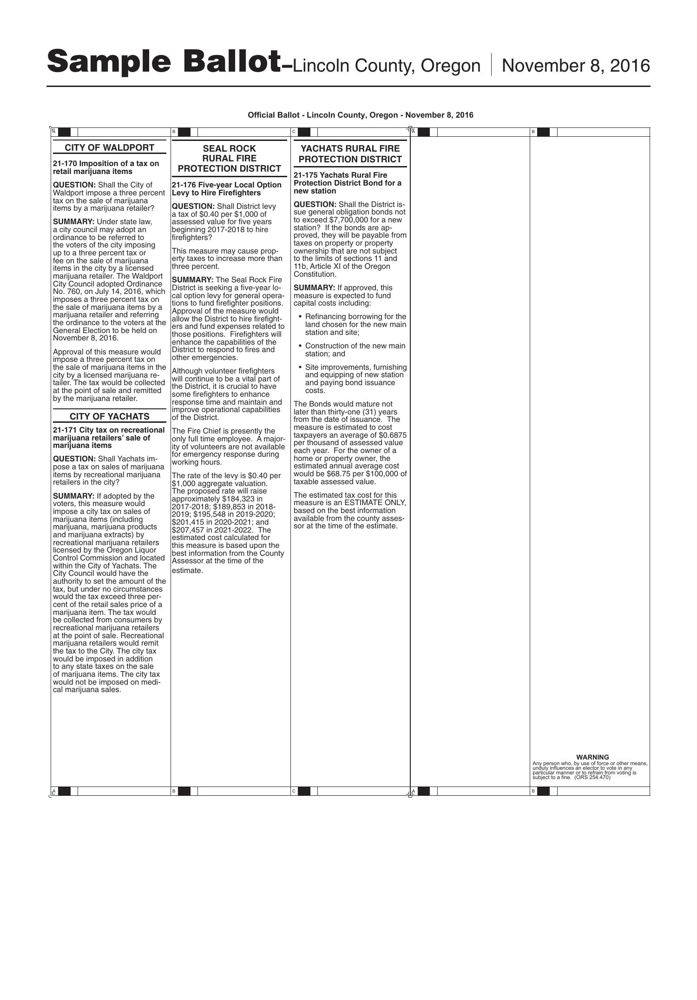

page2.jpg
[{'boxes': tensor([[  42.1685,  230.9215,  553.6257,  463.2721],
        [  45.9233, 1684.3453,  551.9652, 2367.8027],
        [  56.4102,  485.2886,  538.6873,  710.9166],
        [  47.6815,  894.1140,  548.6597, 1699.5146],
        [  44.9020, 1047.9424,  732.4316, 1491.6289],
        [  68.1187,  227.3699,  533.6443,  741.9001],
        [ 120.3523,  225.4781,  363.1521,  508.0221],
        [ 555.0820,  214.4836, 1068.2261,  809.0189],
        [  62.5077,  742.3271,  474.9230, 2450.4495],
        [  75.8231, 1421.9362,  432.4053, 1626.4545],
        [  88.6634,  490.5507,  521.6478,  598.4825],
        [ 569.3027, 1420.3060, 1068.7723, 2087.0696],
        [  63.2194, 1304.3248,  508.5972, 1621.8463],
        [ 120.6776,  445.8794,  359.4155,  733.5886],
        [  70.0585, 1946.9980,  507.3125, 2281.6851],
        [  70.4826, 1760.9667,  484.9220, 2013.6036],
        [  78.9239, 2113.2537,  432.1456, 2310.3716],
        [  70.4012,  981.3978,  482.5155, 1247.2520],
       

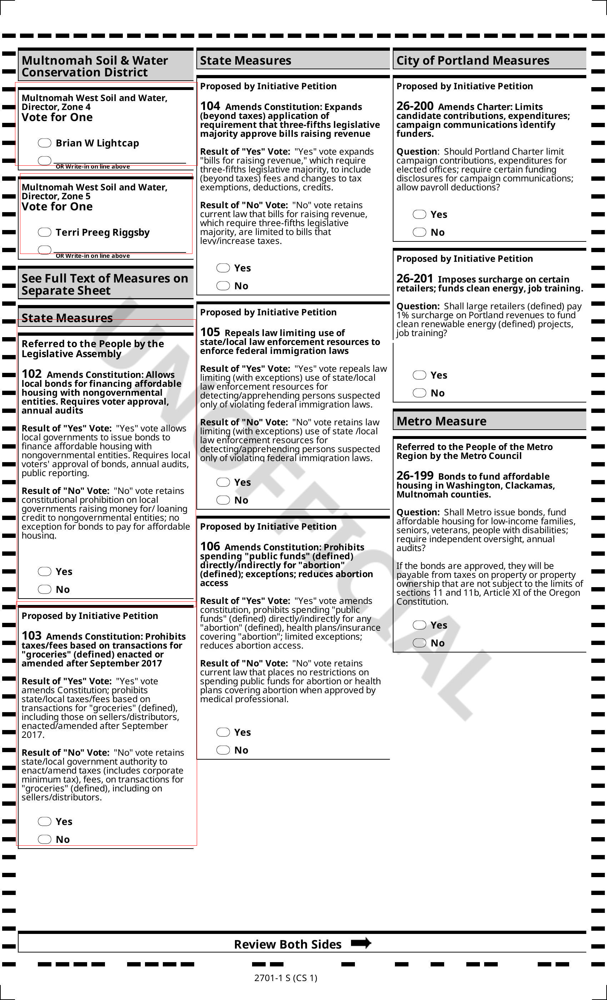

tmp0001-3.jpg
[{'boxes': tensor([[ 842.4314,  999.3209, 1181.1166, 1727.0018],
        [  66.7099, 1010.6665,  403.0947, 1728.3845],
        [ 375.7796, 1255.6217,  791.7225, 1672.7290],
        [ 108.3477,  632.3967,  462.9864, 1383.4097],
        [ 129.1519,  326.2016,  374.3179,  695.0489],
        [ 347.9619, 1004.8727,  726.7796, 1764.1431],
        [ 456.9250,  945.4480, 1341.9805, 1701.7415],
        [ 106.0078,  345.8850,  459.8842, 1138.5377],
        [  58.1285,  972.9042,  985.4066, 1742.3517],
        [ 668.7676,  318.8871,  848.5874,  563.1451],
        [ 539.9644, 1007.4150,  915.0071, 1705.6327],
        [ 121.9409, 1287.9781,  938.7496, 1641.0514],
        [  87.1079,  604.4482,  929.4457,  930.9045],
        [ 136.2459, 1179.8396,  336.7614, 1704.5070],
        [ 916.4503,  598.3428, 1130.8369,  992.2455],
        [ 878.4619,  311.2868, 1208.7155, 1077.4677],
        [  36.2838,  552.4976,  444.6948, 1794.2747],
        [ 665.2266,  588.5468,  864.9421,  956.0529],
   

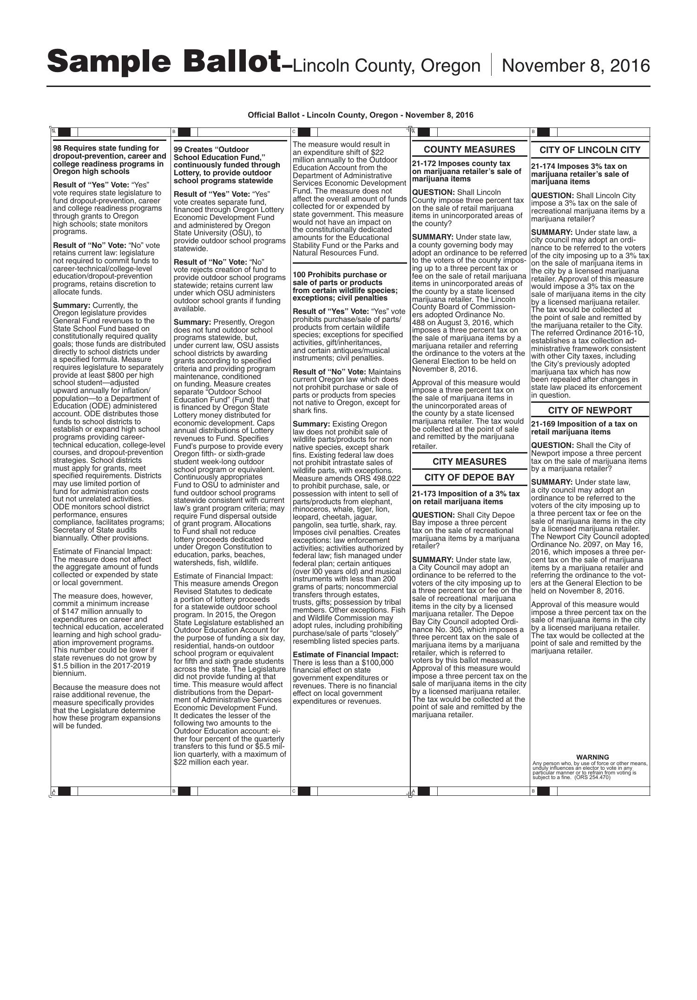

page1.jpg
[{'boxes': tensor([[  59.1057, 1472.1372,  550.6526, 1932.4268],
        [  84.8979, 1929.5616,  546.0106, 2201.0110],
        [  42.0141,  956.6226,  549.4707, 1351.8374],
        [ 552.0842,  771.2708, 1098.0042,  962.7682],
        [  91.0073,  434.9521,  493.4239,  884.1526],
        [ 604.6262,  731.5305,  835.8491, 1018.2343],
        [  58.3478, 1713.4093,  528.1685, 1886.1130],
        [ 116.6820, 1944.8245,  373.2354, 2233.9409],
        [  72.0414,  518.2510,  556.0349, 1447.8859],
        [  63.4076,  888.2790,  462.7701, 2262.3633],
        [  64.4493, 1490.1708,  476.0959, 1728.2391],
        [ 602.0804, 1848.0090, 1054.8848, 2029.2805],
        [1155.7411, 1368.7109, 1603.8827, 1535.5950],
        [1187.2202,  792.5312, 1626.4558,  954.4191],
        [  76.5996, 1186.4659,  530.1759, 1340.2008],
        [  28.6996, 1529.3174, 1022.1873, 1802.3555],
        [ 186.4659,  975.2122,  451.8539, 1351.6144],
        [  88.0651,  950.2355,  322.7195, 1358.4930],
       

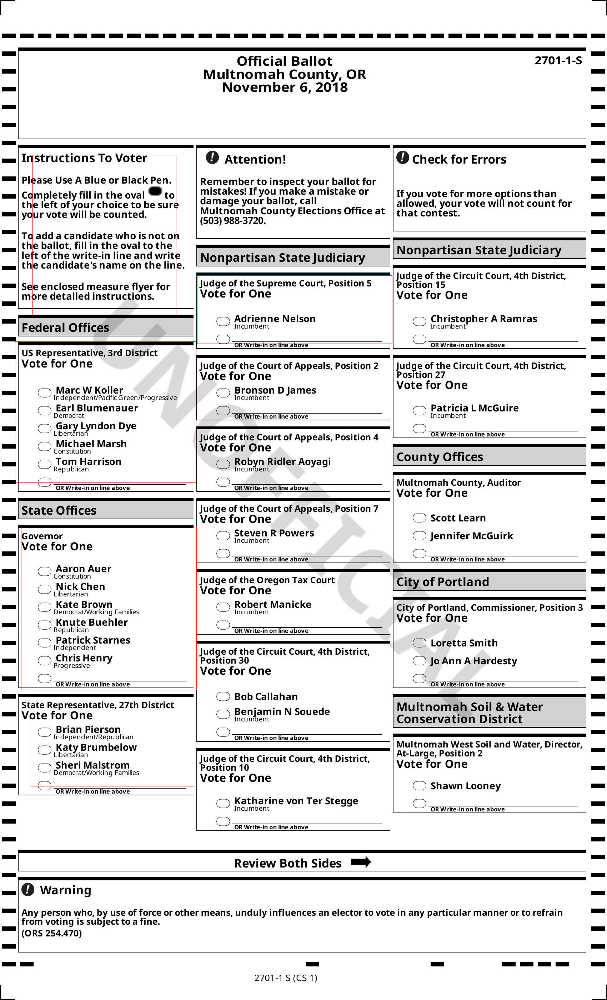

page4.jpg
[{'boxes': tensor([[ 111.0582,  444.8157,  334.1555,  682.9940],
        [ 123.1591, 1162.5892,  318.4702, 1335.9764],
        [ 128.0657,  741.9140,  306.9554,  908.5869],
        [ 110.6164,  874.2123,  328.7180, 1085.7843],
        [ 122.9334, 1212.7518,  322.3981, 1456.1907],
        [ 125.5272, 1338.9012,  310.0132, 1494.1246],
        [ 568.0092, 1140.5004,  941.6763, 1778.3147],
        [ 125.4251,  746.2772,  293.0795, 1067.4691],
        [ 496.7437, 1315.9244, 1222.1921, 1651.4293],
        [ 162.2243,  488.0412,  305.2111,  630.5025],
        [ 610.8895, 1340.1450,  999.6898, 1694.6947],
        [ 107.6642, 1343.1351,  346.0174, 1602.4003],
        [ 426.6633,  876.8734,  605.4068, 1201.8246],
        [  98.6192, 1288.8715,  331.7512, 1421.3564]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.9804, 0.9383, 0.7761, 0.7453, 0.7414, 0.6736, 0.2292, 0.1301, 0.0816,
   

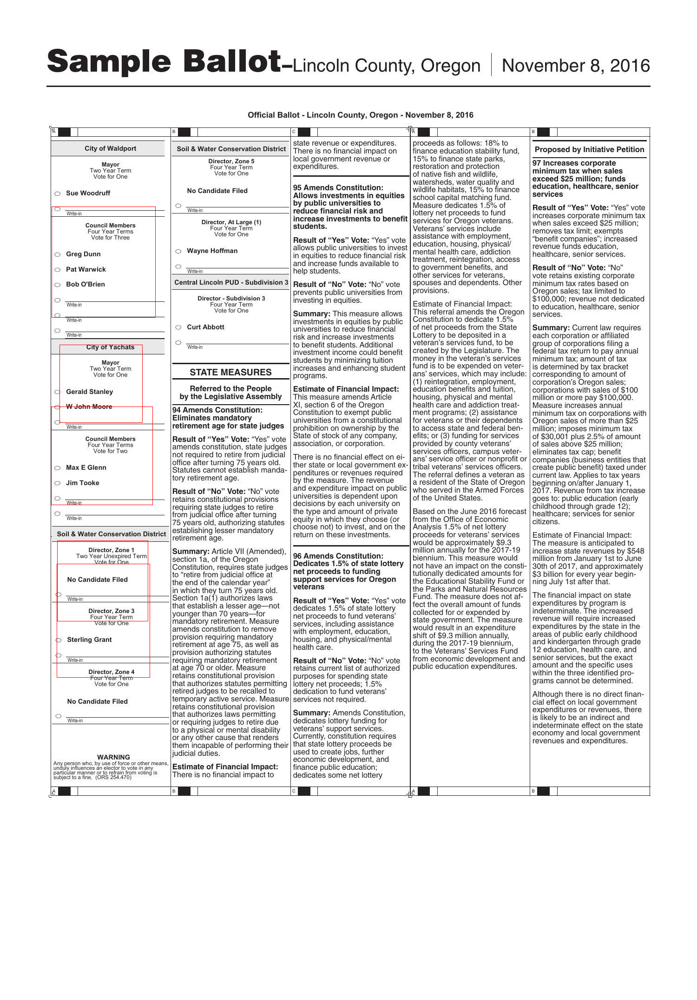

page3.jpg
[{'boxes': tensor([[ 105.9571,  773.8957,  363.8484, 1043.7439],
        [ 119.5771,  547.1456,  369.7812,  756.0902],
        [ 111.8973, 1060.7882,  362.2108, 1254.4374],
        [ 121.8311, 1288.1223,  341.9261, 1601.8550],
        [ 386.6146, 1449.8739,  584.4180, 1642.7401],
        [ 149.4667, 1111.8164,  352.3575, 1215.4150],
        [ 421.6678,  304.8991,  597.3148,  604.2964],
        [ 180.4040, 1072.3364,  310.5551, 1258.1952],
        [ 398.5399, 1265.5735,  573.1752, 1482.2690],
        [1155.9860, 1302.8934, 1367.3787, 1635.6206],
        [ 149.9887, 1021.6574,  300.0017, 1137.6320],
        [ 668.7460, 1172.2927,  839.1204, 1454.3290],
        [ 416.2906,  861.2628,  580.8649, 1051.3563],
        [ 126.1147,  850.9823,  349.6490, 1224.9125],
        [  58.8312,  505.2075,  407.2829,  805.3828],
        [ 123.7970,  319.3763,  369.2029,  510.8507],
        [  43.4488,  530.4730,  420.4401, 1069.1058],
        [  46.2459,  726.6544,  400.9286, 1251.1522]], device

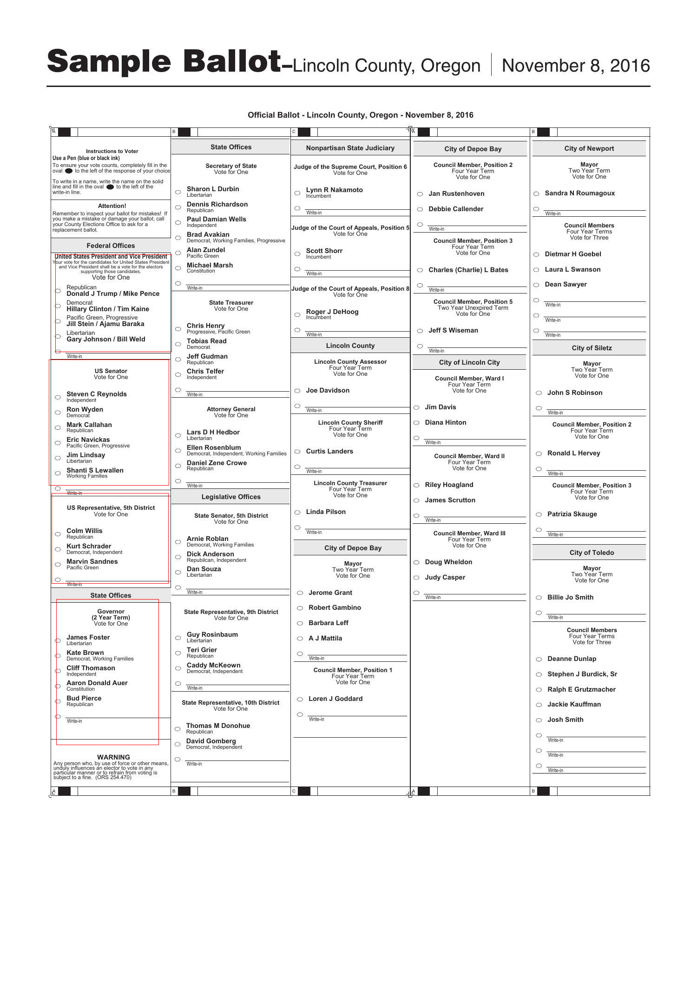

page0.jpg
[{'boxes': tensor([[  45.7308, 1650.8601,  553.7010, 2051.6746],
        [  36.9673, 2467.5691,  558.1771, 2841.2964],
        [ 554.9443,  721.4086, 1092.3292, 1134.0375],
        [ 569.2872, 1182.0815, 1091.0632, 1501.6813],
        [  69.2973, 2087.1580,  541.3948, 2357.1914],
        [  44.8183,  918.2589,  550.3345, 1649.8248],
        [1109.4705, 1272.9324, 1637.6230, 1494.0371],
        [  50.7787,  737.1956,  550.8223, 2331.5222],
        [  99.2347,  385.0393,  527.0324,  881.2009],
        [  49.1971, 1209.3113,  529.4568, 1555.3165],
        [  45.3890,  987.7231,  518.1422, 1356.3882],
        [  82.3699, 1168.2732, 1273.2513, 1504.1432],
        [  77.4024, 1829.0138,  528.9951, 2043.7883],
        [ 536.1049,  928.5229, 1093.2924, 1131.6222],
        [  62.8236, 1522.2412,  549.2809, 2827.6428],
        [1164.6882, 1223.1038, 1464.2015, 1537.8960],
        [  70.3524, 1840.6270,  563.0154, 2395.6777],
        [  68.7880, 1949.6000,  512.2237, 2062.5737],
       

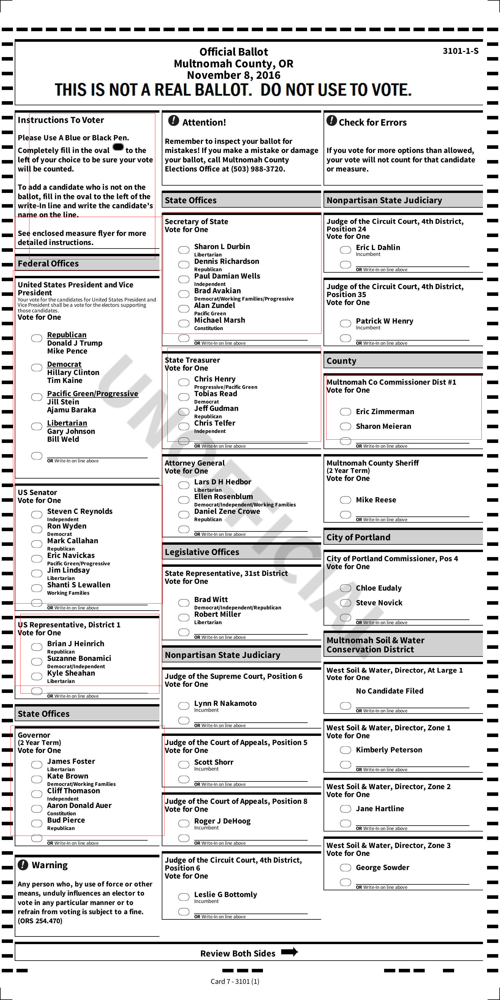

In [20]:
from PIL import ImageDraw
from PIL import Image
from IPython.display import display
import numpy as np
transforms=get_transform()
eval_dir = 'my_data/eval'
for imgpath in os.listdir(eval_dir):
  if 'jpg' in imgpath:  
    eval_img = Image.open(eval_dir+"/"+imgpath)
    trans_img = [transforms(eval_img).to(device)]
    model.eval()
    eval_results = model(trans_img)

    print(imgpath)
    print(eval_results)
    boxes=[]
    scores=[]
    for i in range(len(eval_results[0]['scores'])):
      if eval_results[0]['scores'][i] >= .7:
        boxes.append(eval_results[0]['boxes'][i].cpu().detach().tolist())

    for box in boxes:
      shape = [(box[0], box[1]), (box[2], box[3])] 
      img1 = ImageDraw.Draw(eval_img)   
      img1.rectangle(shape, outline ="red")

    display(eval_img)

### conclusions

Clearly the evaluation results from the model trained to detect contest boxes leaves much to be desired. Even the ballot images used during training cannot be evaluated very well.

The first observation is that diversity in style of contest box will require more training data. In this case, only the left side of the Multnomah County ballots were annotated; as a result, the model only looked for full contest boundings on the left sides of the images. 

The model did avoid placing rectangles around boxes that contained no bubbles for the most part, but one instructional box with an example filled in bubble was identified as a contest box. 

It is clear that for this task, we need much more data train our model to achieve good results.